# Interpretability

Interpretability is the ability to understand and explain how a deep learning model is making decisions. One of the challenges in deep learning is that models are often composed of many layers of interconnected neurons, which can make it difficult to understand how the model is using the input data to make predictions. There are a number of approaches that have been developed to improve the interpretability of deep learning models, including techniques that allow for the visualization of the internal workings of the model and methods that simplify the model to make it more transparent. Research in this area is ongoing, and as the field of deep learning continues to evolve, it is expected that new methods for improving the interpretability of deep learning models will be developed.

## CNN Visualization

It is often said that deep learning models are “black boxes”, learning representations that are difficult to extract and present in a human-readable form. While this is partially true for certain types of deep learning models, it is definitely not true for convnets. The representations learned by convnets are highly amenable to visualization, in large part because they are representations of visual concepts. A wide array of techniques have been developed for visualizing and interpreting these representations. We won't survey all of them, but we will cover two of the most accessible and useful ones:

* Visualizing heatmaps of class activation in an image. This is useful to understand which part of an imagewere identified as belonging to a given class, and thus allows to localize objects in images.
* Visualizing intermediate convnet outputs (“intermediate activations”). This is useful to understand how successive convnet layers transform their input, and to get a first idea of the meaning of individual convnet filters.



#### Sample network and images

We will start by loading a na neural network model. As we don't have time to train the model from scratch, we will use an already pre-trained network, but all those interpretability methods are useful for your own models too.

There are many pre-trained models available in Keras Applications. Some of the most popular are ResNet, Inception, EfficientNet or MobileNet. We will, however use VGG16, a very simple model proposed in 2014, as its layer structure is easy to understand. 

In [26]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
 
from tensorflow.keras import models
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
 
 
model = VGG16(weights='imagenet', include_top=True) #Load alredy pre-trained model
model.summary() #Print a list of layers with all the details

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Then, we have to load some images. Your task is to find three real life object images, save them and write down the file path. We will try to see how the network recognises those images and what labels from ImageNet database it assigns. 

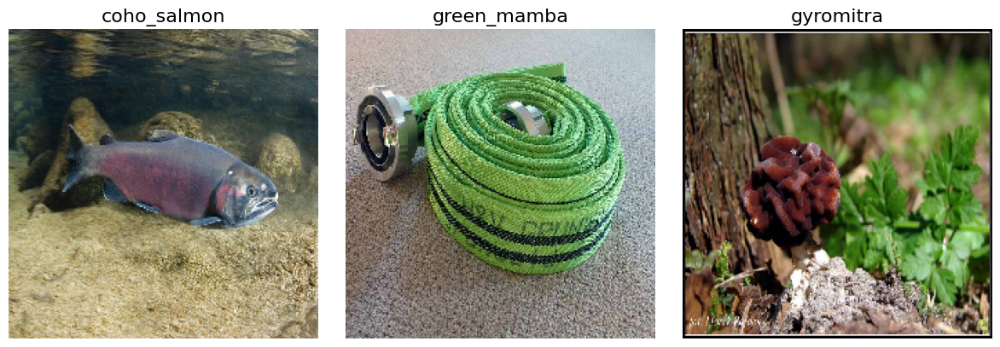

In [27]:
#Further on, each time you will need to complete the code, it will be marked by #TODO
 
# Assign image titles for your images
image_titles = ['coho_salmon', 'green_mamba', 'gyromitra']
 
# Load images and reshape them
img1 = load_img('images\coho_salmon_750x500.jpg', target_size=(224, 224))
img2 = load_img('images\green_mamba_strazacki.jpg', target_size=(224, 224))
img3 = load_img('images\gyromitra.jpg', target_size=(224, 224))
#We resize the images into size 224 x 224, as the model prefers those sizes. However, if your images are smaller, you can change those values a little bit.
 
# Convert them to a Numpy array
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])
 
# Preparing input data for VGG16
X = preprocess_input(images) #TODO apply preprocessing function specific to VGG network (you have already imported it)
 
# Rendering
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

We can check if the network correctly recognises the image by running a predict function. Then, we can assign each numerical value of a class a meaning from a dictionary. 

In [28]:
# Predict the output (probabilities) of the layer, corresponding to an image
preds = model.predict(X) #TODO feed images into the network and see the results (use "predict" function)
best_class = np.argmax(preds, axis=1) #TODO find the best class (use argmax or argsort function)

print('Predicted:', decode_predictions(preds, top=3)[0]) #Decode prediction based on Imagenet dataset dictionary. Each umerical class is assigned to a real-life label
print('Predicted:', decode_predictions(preds, top=3)[1])
print('Predicted:', decode_predictions(preds, top=3)[2])

1/1 [==============================] - 0s 496ms/step
Predicted: [('n02536864', 'coho', 0.5301082), ('n02526121', 'eel', 0.27669653), ('n02640242', 'sturgeon', 0.071527764)]
Predicted: [('n03065424', 'coil', 0.9380172), ('n03627232', 'knot', 0.016257826), ('n03814906', 'necklace', 0.01117821)]
Predicted: [('n13037406', 'gyromitra', 0.9996302), ('n12985857', 'coral_fungus', 0.00012023025), ('n07734744', 'mushroom', 8.773262e-05)]


## Visualizing heatmaps

The first visualization technique is the one that is useful for understanding which parts of a given image led a convnet to its final classification decision. This is helpful for “debugging” the decision process of a convnet, in particular in case of a classification mistake. It also allows you to locate specific objects in an image.

This general category of techniques is called “Class Activation Map” (CAM) visualization and consists of producing heatmaps of “class activation” over input images. A “class activation” heatmap is a 2D grid of scores associated with a specific output class, computed for every location in any input image, indicating how important each location is with respect to the class considered. For instance, given an image fed into “cat vs. dog” convnet, Class Activation Map visualization allows us to generate a heatmap for the class “cat”, indicating how cat-like different parts of the image are, and likewise for the class “dog”, indicating how dog-like different parts of the image are.

The specific implementation we will use is the one described in the paper Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization.

GradCAM works by using the gradients of the model's final prediction with respect to the activations of the last convolutional layer to generate a heatmap that shows which parts of the input data had the greatest impact on the prediction. Intuitively, one way to understand this trick is that we are weighting a spatial map of “how intensely the input image activates different channels” by “how important each channel is with regard to the class”, resulting in a spatial map of “how intensely the input image activates the class”.

Before we begin, we need to install the tf_keras_vis library and load four algorithms available in this library, as well as some pre-processing functions. Those methods are:

* GradCAM
* GradCAM++
* ScoreCAM
* Saliency Maps


In [29]:
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.scorecam import Scorecam
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

Then, we will define a function that will be used to visualise the output heatmap generated by all four algorithms. 

In [30]:
def visualise_heatmap(map):
  f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
  for i, title in enumerate(image_titles):
      heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
      ax[i].set_title(title, fontsize=16)
      ax[i].imshow(images[i])
      ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
      ax[i].axis('off')
  plt.tight_layout()
  plt.show()

### GradCAM

Let's start with basic GradCAM. First, we need to replace the last activation function, in the last layer with linear output. By default, neural networks used for classification have softmax output. For GradCAM, we need a raw output.

Then, we need to provide a score - a list of classes that we want to visualise. If you want to see another class than the best one, this is the place where you have to change the numbers. 

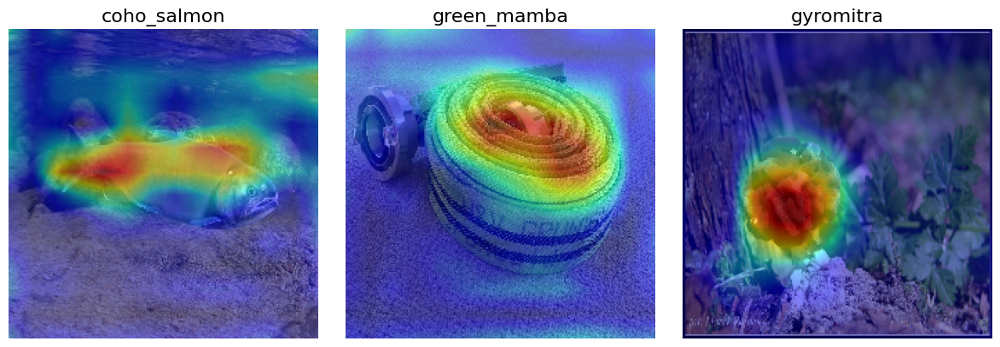

In [31]:
replace2linear = ReplaceToLinear()
score = CategoricalScore(list(best_class))
 
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)
 
cam = gradcam(score,
              X,
              penultimate_layer=-1)
 
visualise_heatmap(cam)

### GradCAM++

The second method will be GradCAM++. In theory, it should provide better visualisation and better understanding of where the object is and cover the larger part of it. Let's see how it works for your images. 

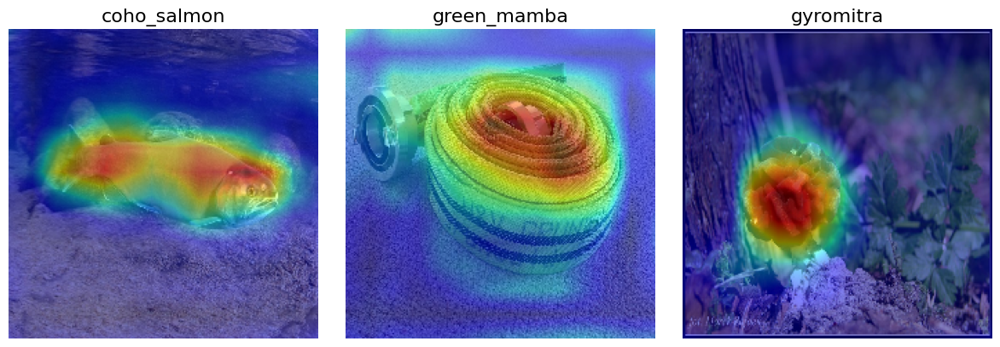

In [15]:
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)
 
cam = gradcam(score,
              X,
              penultimate_layer=-1)
 
visualise_heatmap(cam)

### ScoreCAM

Now, it is time for ScoreCAM. ScoreCAM is a visualization technique that is similar to GradCAM, but rather than using the gradients, it uses the model's output logits (i.e., the raw output of the model before the softmax activation function is applied) to generate a heatmap that shows which parts of the input data had the greatest impact on the prediction. 

48/48 [==============================] - 146s 3s/step


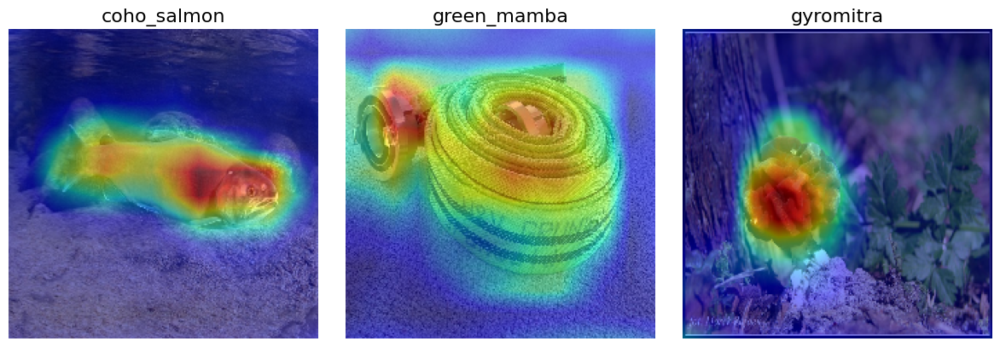

In [16]:
scorecam = Scorecam(model)
cam = scorecam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

### Saliency Maps

The last method would be Saliency Maps. They are the simplest of those methods, basically displaying raw values of neural network output gradients. 

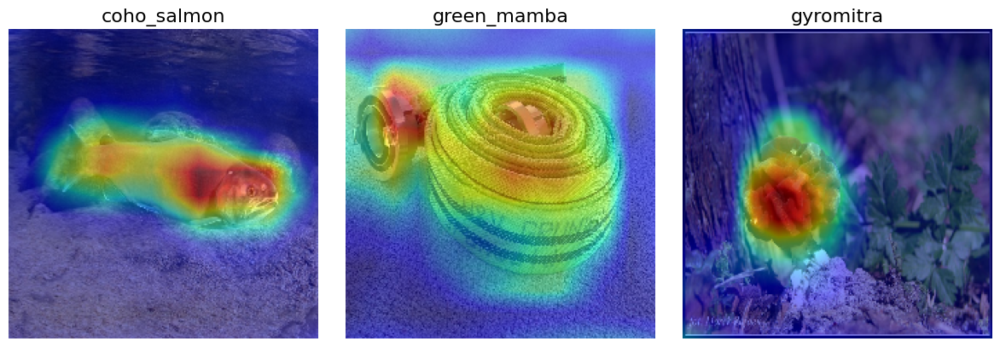

In [17]:
saliency = Saliency(model, model_modifier=replace2linear, clone=True)
saliency_map = saliency(score, X)
visualise_heatmap(saliency_map)

Finally, we can smooth those outputs a little, to make them visually more appealing. 

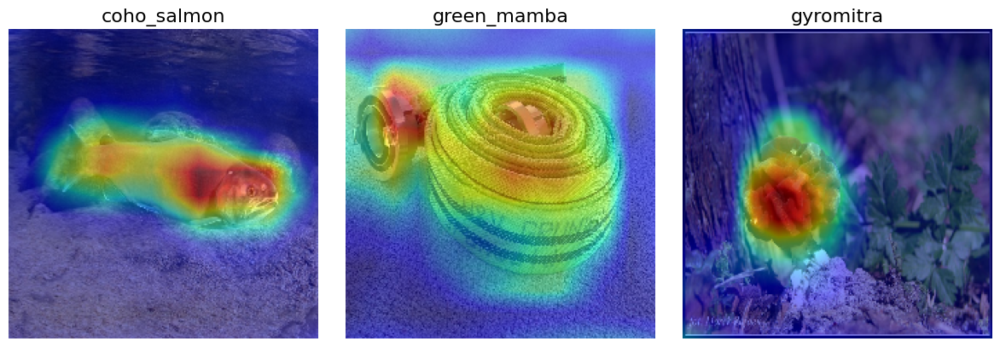

In [18]:
saliency_map = saliency(score, X, smooth_samples=20, smooth_noise=0.20)
visualise_heatmap(saliency_map)

Tasks to do:
* Task 1 You can test the performance of all these methods on images that have more than one object. Check if the network classifies the image based on just one object, or all of them.
* Task 2 You can visualise a heatmap that corresponds to a different class than the class with the highest probability - for example, the second best, 5th best, 10th best etc.
* Task 3 You can test the performance on an image with two contradictory objects, such as dog and cat.

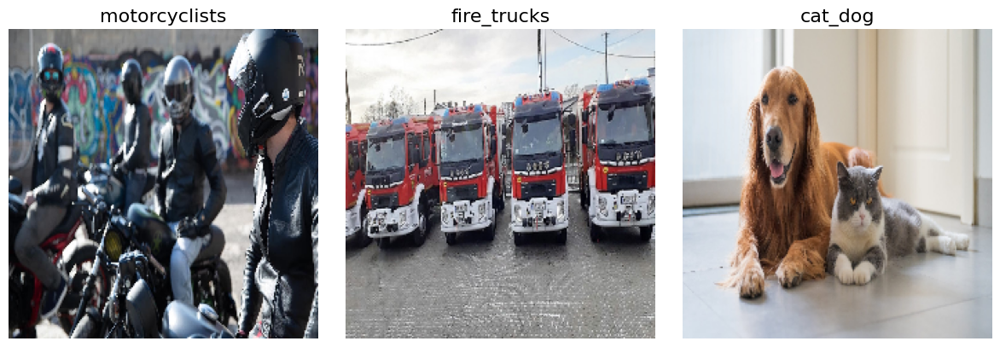

In [23]:
#Further on, each time you will need to complete the code, it will be marked by #TODO
 
# Assign image titles for your images
image_titles = ['motorcyclists', 'fire_trucks', 'cat_dog']
 
# Load images and reshape them
img1 = load_img('images\motorcyclists.jpg', target_size=(224, 224))
img2 = load_img(R'images\fire_trucks.jpg', target_size=(224, 224))
img3 = load_img('images\cat_dog.jpg', target_size=(224, 224))
#We resize the images into size 224 x 224, as the model prefers those sizes. However, if your images are smaller, you can change those values a little bit.
 
# Convert them to a Numpy array
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])
 
# Preparing input data for VGG16
X = preprocess_input(images) #TODO apply preprocessing function specific to VGG network (you have already imported it)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [24]:
# Predict the output (probabilities) of the layer, corresponding to an image
preds = model.predict(X) #TODO feed images into the network and see the results (use "predict" function)
best_class = np.argmax(preds, axis=1) #TODO find the best class (use argmax or argsort function)

print('Predicted:', decode_predictions(preds, top=3)[0]) #Decode prediction based on Imagenet dataset dictionary. Each umerical class is assigned to a real-life label
print('Predicted:', decode_predictions(preds, top=3)[1])
print('Predicted:', decode_predictions(preds, top=3)[2])

1/1 [==============================] - 0s 379ms/step
Predicted: [('n03127747', 'crash_helmet', 0.16090299), ('n03379051', 'football_helmet', 0.15829062), ('n02860847', 'bobsled', 0.12983124)]
Predicted: [('n03345487', 'fire_engine', 0.8381345), ('n02701002', 'ambulance', 0.0891865), ('n04461696', 'tow_truck', 0.050843984)]
Predicted: [('n02088094', 'Afghan_hound', 0.7585277), ('n02091831', 'Saluki', 0.09216652), ('n02088238', 'basset', 0.04023498)]


### GradCAM

Let's start with basic GradCAM. First, we need to replace the last activation function, in the last layer with linear output. By default, neural networks used for classification have softmax output. For GradCAM, we need a raw output.

Then, we need to provide a score - a list of classes that we want to visualise. If you want to see another class than the best one, this is the place where you have to change the numbers. 

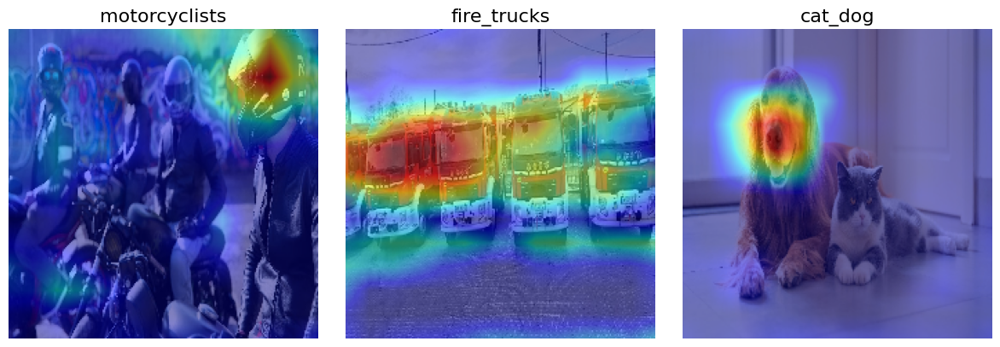

In [25]:
replace2linear = ReplaceToLinear()
score = CategoricalScore(list(best_class))
 
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)
 
cam = gradcam(score,
              X,
              penultimate_layer=-1)
 
visualise_heatmap(cam)

GradCAM++

The second method will be GradCAM++. In theory, it should provide better visualisation and better understanding of where the object is and cover the larger part of it. Let's see how it works for your images. 

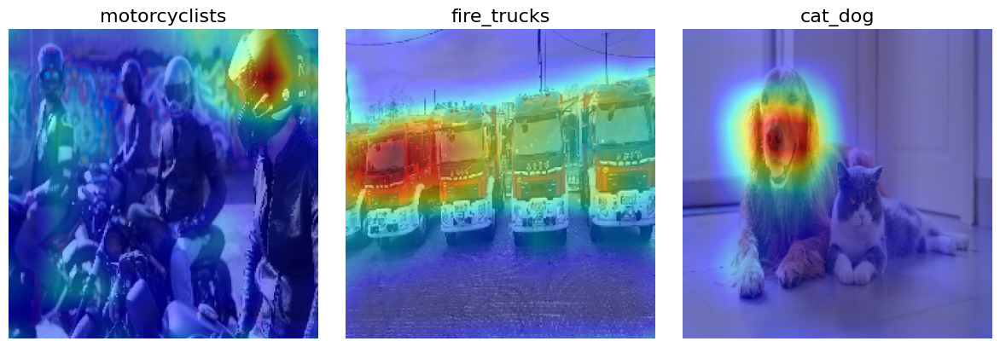

In [26]:
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)
 
cam = gradcam(score,
              X,
              penultimate_layer=-1)
 
visualise_heatmap(cam)

### ScoreCAM

Now, it is time for ScoreCAM. ScoreCAM is a visualization technique that is similar to GradCAM, but rather than using the gradients, it uses the model's output logits (i.e., the raw output of the model before the softmax activation function is applied) to generate a heatmap that shows which parts of the input data had the greatest impact on the prediction. 

48/48 [==============================] - 146s 3s/step


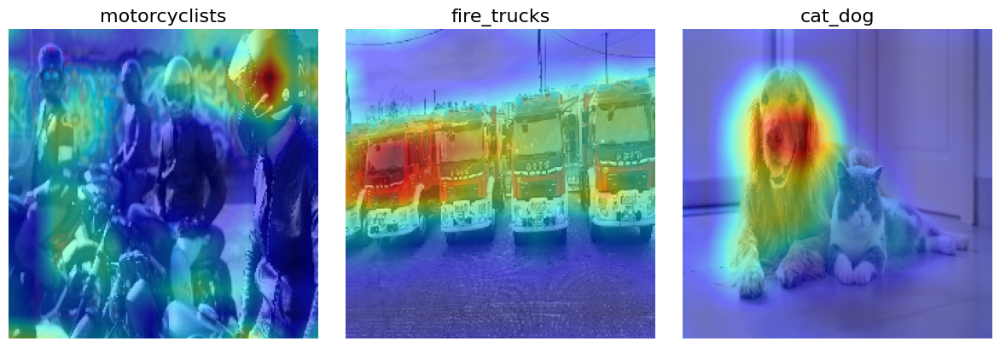

In [27]:
scorecam = Scorecam(model)
cam = scorecam(score, X, penultimate_layer=-1)
visualise_heatmap(cam)

### Saliency Maps

The last method would be Saliency Maps. They are the simplest of those methods, basically displaying raw values of neural network output gradients. 

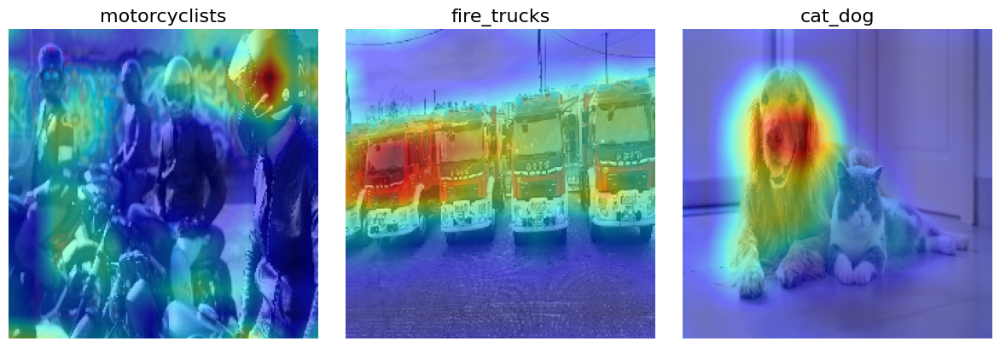

In [28]:
saliency = Saliency(model, model_modifier=replace2linear, clone=True)
saliency_map = saliency(score, X)
visualise_heatmap(saliency_map)

Finally, we can smooth those outputs a little, to make them visually more appealing. 

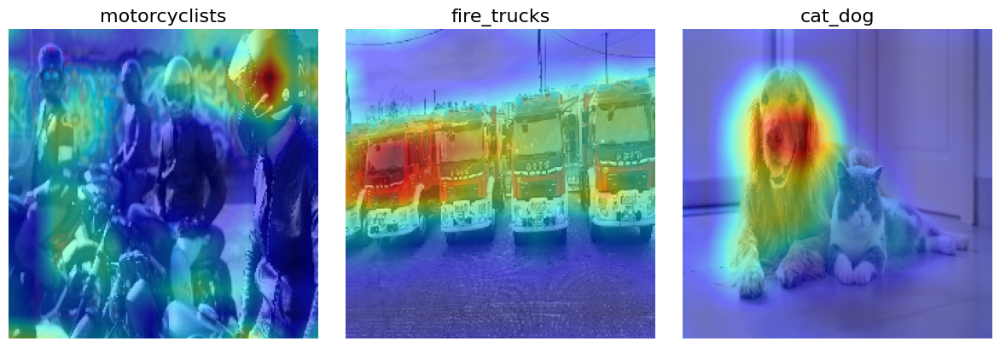

In [29]:
saliency_map = saliency(score, X, smooth_samples=20, smooth_noise=0.20)
visualise_heatmap(saliency_map)

## Visualizing intermediate activations

We will introduce one more visualization technique. Visualizing intermediate activations consists of displaying the feature maps that are output by various convolution and pooling layers in a network, given a certain input (the output of a layer is often called its “activation”, the output of the activation function). This gives a view into how input is decomposed into the different filters learned by the network. These feature maps we want to visualize have 3 dimensions: width, height, and depth (channels). Each channel encodes relatively independent features, so the proper way to visualize these feature maps is by independently plotting the contents of every channel, as a 2D image. 

1/1 [==============================] - 0s 276ms/step
['input_3', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool', 'flatten', 'fc1', 'fc2']
input_3
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten
fc1
fc2


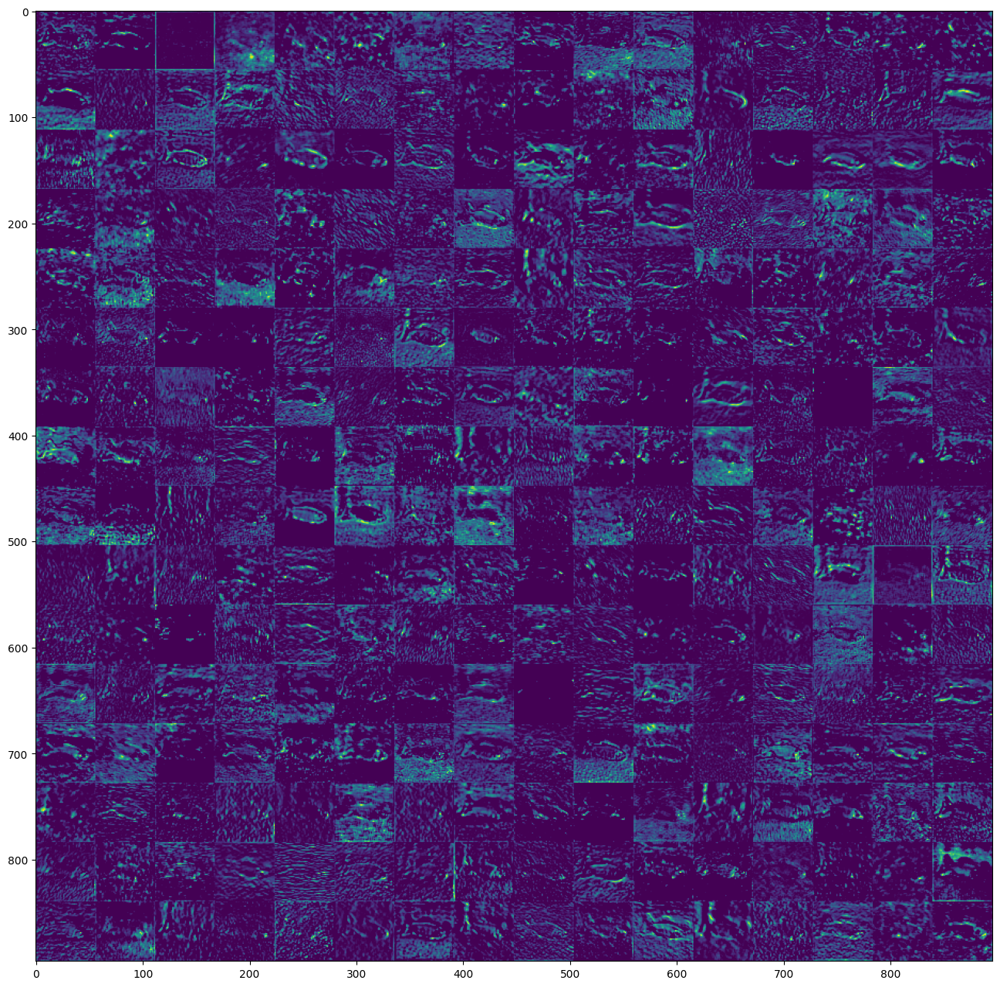

In [32]:
layer_outputs = [layer.output for layer in model.layers] #Loop through the model defined in the beginning to access outputs of individual layers
activation_model = models.Model(model.input, layer_outputs)
X_reshaped = X[0].reshape(1, 224, 224, 3) #TODO take one image and reshape it into size (1,224,224,3)

activations = activation_model.predict(X_reshaped) #TODO use the predict function on the activation model to get the intermediate activations
 
layer_names = []
for layer in model.layers[:-1]:
    layer_names.append(layer.name)

print(layer_names)
 
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    print(layer_name)
    if layer_name == layer_names[7]: #TODO Specify the name of the layer that you want to see. Choose one name from the model summary we printed in the beginning
        number_of_feature_maps = layer_activation.shape[-1]
        feature_map_shape = layer_activation.shape[1]
        n_cols = number_of_feature_maps // images_per_row
        display_grid = np.zeros((feature_map_shape * n_cols, images_per_row * feature_map_shape))
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,:, :, col * images_per_row + row]
                channel_image /= np.max(channel_image)
                display_grid[col * feature_map_shape : (col + 1) * feature_map_shape, row * feature_map_shape : (row + 1) * feature_map_shape] = channel_image
        scale = 1. / feature_map_shape

        plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        plt.imshow(display_grid, aspect='auto', cmap='viridis')